# 1. Environment

## 1.1 Kaggle environment

In [1]:
import os
import shutil

os.mkdir("/kaggle/working/code")
os.mkdir("/kaggle/working/model")
os.mkdir("/kaggle/working/output")
shutil.copyfile(src="/kaggle/input/models-with-code/code/swin_transformer_v2.py", 
                dst="/kaggle/working/code/swin_transformer_v2.py")
shutil.copyfile(src="/kaggle/input/models-with-code/model/swinv2_tiny_patch4_window16_256.pth", 
                dst="/kaggle/working/model/swinv2_tiny_patch4_window16_256.pth")
os.chdir("/kaggle/working/code")

%config Completer.use_jedi = False

## 1.2 Python environment

In [2]:
!pip install torch==1.8.0 torchvision==0.9.0 torchaudio==0.8.0
!pip install timm==0.4.12 opencv-python==4.4.0.46 termcolor==1.1.0 yacs==0.1.8 pyyaml scipy
!pip install ipywidgets captum grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 735.5/735.5 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.7 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.0
    Uninstalling torch-1.13.0:
      Successfully uninstalled torch-1.13.0
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.0
    Uninstalling torchvision-0.14.0:
      Successfully uninstalled torchvision-0.14.0
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 0.13.0
    Uninstalling torchaudio-0.13.0:
      Successfully uninstalled torchaudio-0.13.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchmetrics 0.11.4 requires torch>=1.8.1, but you have torch 1.8.0 which is incompatibl

In [3]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [4]:
import gc
import random

import torch
import warnings
import torchvision
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from torch import optim
from torchvision import models
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset, sampler
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from captum.attr import Saliency
from captum.attr import DeepLift
from captum.attr import Occlusion
from captum.attr import IntegratedGradients
from captum.attr import visualization as viz

from swin_transformer_v2 import SwinTransformerV2

In [5]:
# set random seeds to make results reproducible
def seed_everything(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

SEED = 42
seed_everything(SEED)

In [6]:
warnings.filterwarnings("ignore")
plt.rcParams.update({'axes.titlesize': 20})

## 1.3 Arguments

We put hyperparameter together for easy modification.

In [7]:
class Args:
    def __init__(self) -> None:
        # data arguments
        self.num_classes = 2
        self.img_size = 256
        self.num_train_data = 25000
        self.num_test_data = 5000
        self.dataset_path = "/kaggle/input/deepfake-dataset-merged"
        
        # training arguments
        self.learning_rate =  1e-4
        self.epochs = 10
        self.scheduler = True
        self.sch_step_size = 2
        self.sch_gamma = 0.1
        
        # model arguments
        self.drop_path_rate = 0.2
        self.embed_dim = 96
        self.depths = (2, 2, 6, 2)
        self.num_heads = (3, 6, 12, 24)
        self.window_size = 16
        self.load_model_path = "/kaggle/working/model/swinv2_tiny_patch4_window16_256.pth"
        self.save_model_path = "/kaggle/working/output/swinv2_tiny_patch4_window16_256.pth"
        
        # output arguments
        self.output_path = "/kaggle/working/output/"

In [8]:
args = Args()

# 2. Data

## 2.1 Augmentation

Take some augmentation actions on the images to improve training effectiveness.

In [9]:
train_augmentations = transforms.Compose([
    transforms.RandomResizedCrop(args.img_size, scale=(0.6, 1.0), ratio=(3./ 4., 4. / 3.)),
    transforms.RandomHorizontalFlip(0.5),
    # transforms.RandomVerticalFlip(0.1),  # no VerticalFlip
    transforms.RandomPerspective(distortion_scale=0.2, p=0.2),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])
test_augmentations = transforms.Compose([
    transforms.Resize(args.img_size),
    transforms.CenterCrop(args.img_size),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])
basic_augmentations = transforms.Compose([
    transforms.Resize(args.img_size),
    transforms.CenterCrop(args.img_size),
    transforms.ToTensor()
])

## 2.2 Read and split

Read the datasets and split it into training and testing sets. It should be noted that due to the large size of the original dataset, we will only randomly select a portion of the data to complete our task.

In [10]:
# read train and test dataset
train_dataset = datasets.ImageFolder(root=args.dataset_path + "/train/", transform=train_augmentations)
test_dataset = datasets.ImageFolder(root=args.dataset_path + "/test/", transform=test_augmentations)

In [11]:
# select a subset of the dataset
train_fake_all_indices = np.arange(len(train_dataset) / 2, dtype=np.int32)
train_fake_indices = np.random.choice(train_fake_all_indices, size=int(args.num_train_data / 2), replace=False)
train_real_indices = train_fake_indices + int(len(train_dataset) / 2)
train_indices = np.append(train_fake_indices, train_real_indices)

test_fake_all_indices = np.arange(len(test_dataset) / 2, dtype=np.int32)
test_fake_indices = np.random.choice(test_fake_all_indices, size=int(args.num_test_data / 2), replace=False)
test_real_indices = test_fake_indices + int(len(test_dataset) / 2)
test_indices = np.append(test_fake_indices, test_real_indices)

In [12]:
train_sampler = sampler.SubsetRandomSampler(train_indices)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, num_workers=2, sampler=train_sampler)
test_sampler = sampler.SubsetRandomSampler(test_indices)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=8, num_workers=2, sampler=test_sampler)

In [13]:
classes = train_dataset.classes
class_to_idx = train_dataset.class_to_idx
idx_to_class = dict(zip(class_to_idx.values(), class_to_idx.keys()))

## 2.3 Visualization

Visualize the images we read in, as well as the augmented data.

In [14]:
raw_dataset = datasets.ImageFolder(root=args.dataset_path + "/train/", transform=basic_augmentations)
valid_dataset = datasets.ImageFolder(root=args.dataset_path + "/valid/", transform=basic_augmentations)

In [15]:
# we randomly select real and fake face images
indices = [random.randint(0, len(train_dataset)) for i in range(16)]

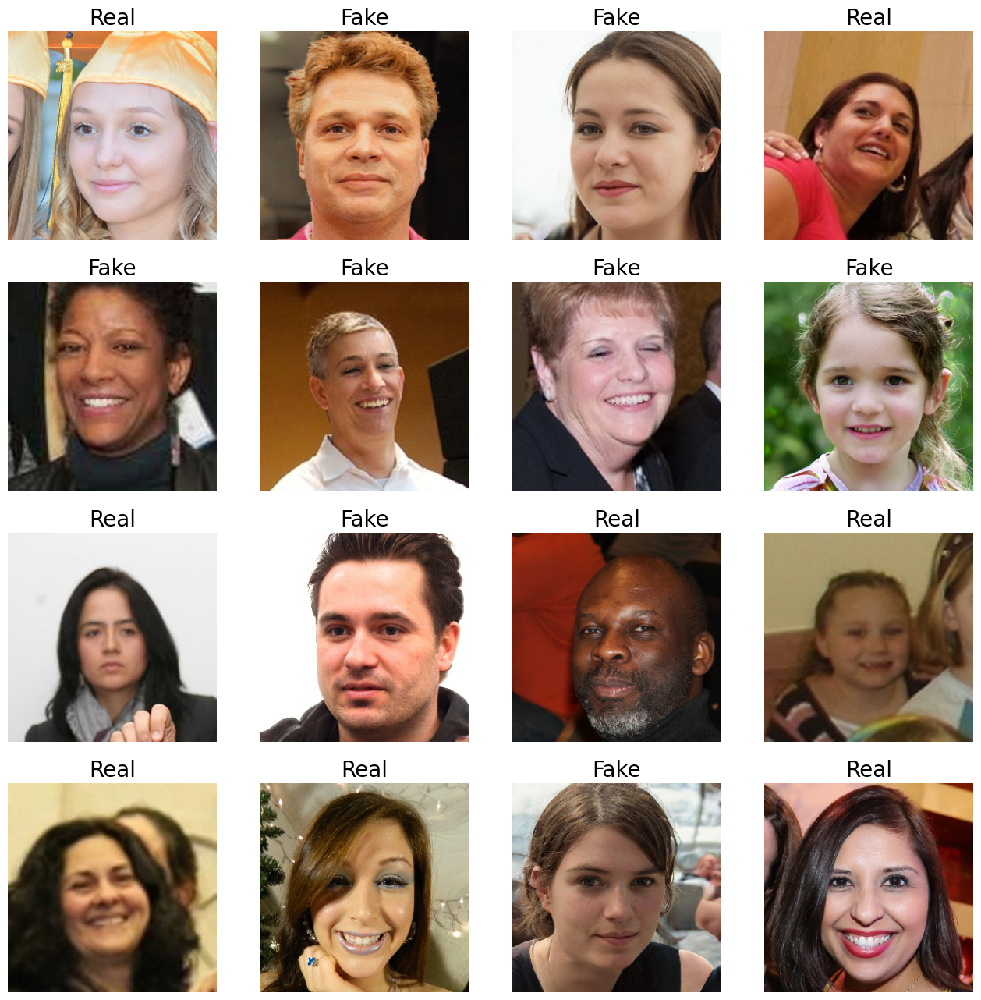

In [16]:
# show raw training data
figure = plt.figure(figsize=(16, 16))
for i in range(16):
    index = indices[i]
    img = raw_dataset[index][0].permute(1, 2, 0)
    label = idx_to_class[raw_dataset[index][1]]
    figure.add_subplot(4, 4, i + 1)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img)

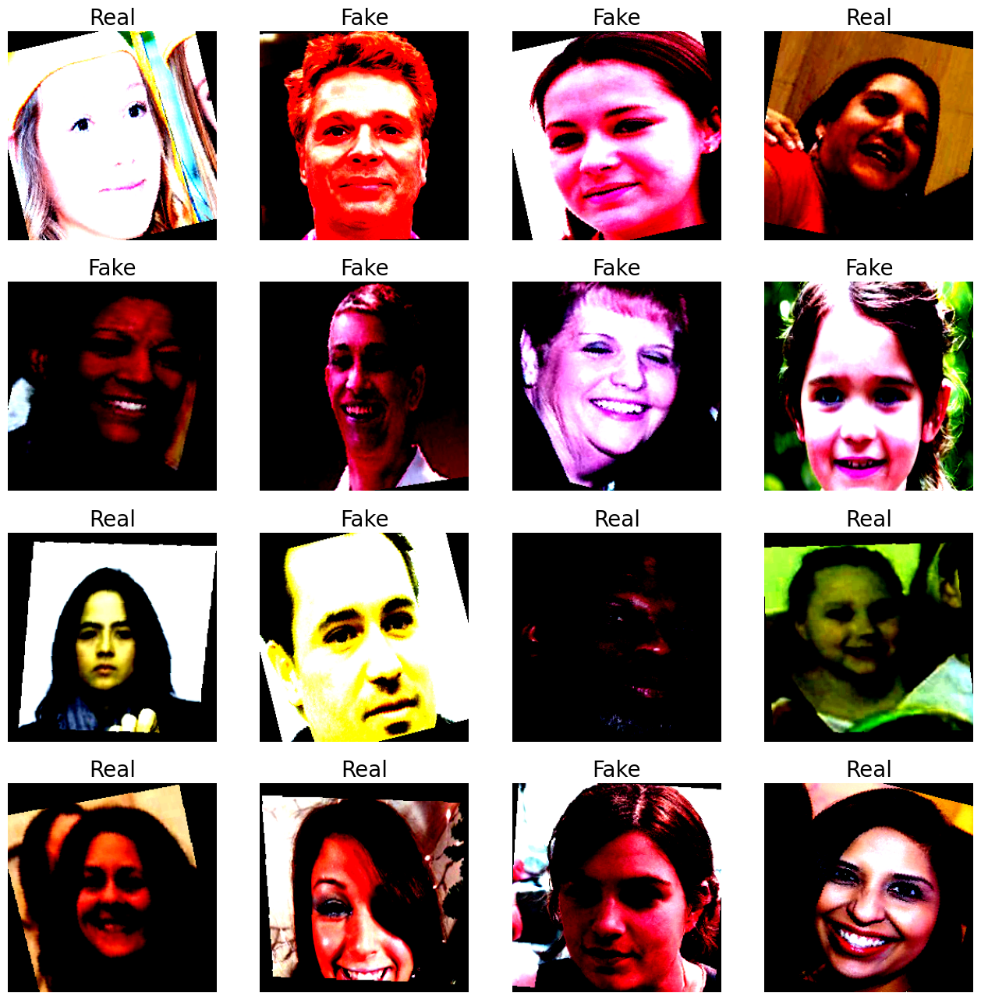

In [17]:
# show augmented training data 
figure = plt.figure(figsize=(16, 16))
for i in range(16):
    index = indices[i]
    img = train_dataset[index][0].permute(1, 2, 0)
    label = idx_to_class[train_dataset[index][1]]
    figure.add_subplot(4, 4, i + 1)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img)

# 3. Model

## 3.1 Network

We will use pre-trained swin-transformer V2 model.

In [18]:
# load pretrained model
model = SwinTransformerV2(img_size=args.img_size,
                          drop_path_rate=args.drop_path_rate, 
                          embed_dim=args.embed_dim,
                          depths=args.depths,
                          num_heads=args.num_heads,
                          window_size=args.window_size)
state_dict = torch.load(args.load_model_path)
model.load_state_dict(state_dict["model"])

<All keys matched successfully>

In [19]:
# change the last linear layer to fit our classification problem
model.head = torch.nn.Linear(model.head.in_features, args.num_classes)

In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [21]:
model = model.to(device)

## 3.2 Optimizer

In [22]:
optimizer = optim.AdamW(model.parameters(), lr=args.learning_rate)

In [23]:
if args.scheduler:
    scheduler = optim.lr_scheduler.StepLR(optimizer, 
                                          step_size=args.sch_step_size, 
                                          gamma=args.sch_gamma)

## 3.3 Loss function

In [24]:
loss_fn = torch.nn.CrossEntropyLoss()

# 4. Train

Start training the model and record the intermediate results, including loss, accuracy, precision, recall and f1-score.

In [25]:
train_acc, test_acc = [], []
train_precision, test_precision = [], []
train_recall, test_recall = [], []
train_f1, test_f1 = [], []
train_loss, test_loss = [], []

In [26]:
class LossBuffer:
    """
    We hope to record all losses over a period of time 
    and calculate their average value,
    which is smooth and does not have too much jitter.
    In fact, we don't need to record the entire array, 
    only the current average and number of records are enough.
    """
    
    def __init__(self, mean=0, n=0):
        self.mean = mean
        self.n = n
        
    def add(self, num):
        self.mean = (self.mean * self.n + num) / (self.n + 1)
        self.n += 1

In [27]:
def train(model, dataloader, epoch):
    model.train()
    correct, cursum = 0, 0
    loop = tqdm(dataloader, total=len(dataloader))
    y_true, y_pred = [], []
    loss_buffer = LossBuffer()
    for idx, (data, label) in enumerate(loop):
        data, label = data.to(device), label.to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        y_true.extend(label.cpu())
        y_pred.extend(pred.cpu())
        acc = accuracy_score(y_true, y_pred)
        
        optimizer.zero_grad()
        loss = loss_fn(output, label)
        loss.backward()
        optimizer.step()
        loss_buffer.add(loss.item())
          
        loop.set_description(f"[Epoch {epoch}/{args.epochs}]")
        loop.set_postfix(LOSS="{:.6f}".format(loss_buffer.mean), ACC="{:.2f}%".format(100 * acc))
    
    if args.scheduler:
        scheduler.step()
        
    precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro')
    torch.save(model.state_dict(), args.save_model_path)
    
    train_acc.append(acc)
    train_precision.append(precision)
    train_recall.append(recall)
    train_f1.append(f1)
    train_loss.append(loss_buffer.mean)

In [28]:
def test(model, dataloader, epoch):
    model.eval()
    correct = 0
    y_true, y_pred = [], []
    with torch.no_grad():
        total_len = len(dataloader.dataset)
        loss_buffer = LossBuffer()
        for idx, (data, label) in enumerate(dataloader):
            data, label = data.to(device), label.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            y_true.extend(label.cpu())
            y_pred.extend(pred.cpu())
            loss = loss_fn(output, label)
            loss_buffer.add(loss.item())
        acc = accuracy_score(y_true, y_pred)
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro')
    
    print("\n" + "-" * 60)
    print("[Epoch {}/{}]:  Test -> LOSS: {:.6f}  |  Accuracy: {:.2f}%".format(epoch, args.epochs, loss_buffer.mean, 100 * acc))
    print("-" * 60 + "\n")
    
    test_acc.append(acc)
    test_precision.append(precision)
    test_recall.append(recall)
    test_f1.append(f1)
    test_loss.append(loss_buffer.mean)

In [29]:
for epoch in range(1, args.epochs + 1):
    train(model, train_loader, epoch)
    test(model, test_loader, epoch)

  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 1/10]:  Test -> LOSS: 0.433314  |  Accuracy: 79.58%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 2/10]:  Test -> LOSS: 0.252293  |  Accuracy: 90.16%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 3/10]:  Test -> LOSS: 0.125493  |  Accuracy: 95.32%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 4/10]:  Test -> LOSS: 0.102085  |  Accuracy: 96.16%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 5/10]:  Test -> LOSS: 0.110267  |  Accuracy: 96.00%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 6/10]:  Test -> LOSS: 0.109802  |  Accuracy: 96.02%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 7/10]:  Test -> LOSS: 0.108855  |  Accuracy: 96.16%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 8/10]:  Test -> LOSS: 0.108875  |  Accuracy: 96.14%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 9/10]:  Test -> LOSS: 0.108953  |  Accuracy: 96.14%
------------------------------------------------------------



  0%|          | 0/1563 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 10/10]:  Test -> LOSS: 0.108956  |  Accuracy: 96.14%
------------------------------------------------------------



# 5. Visualization

## 5.1 Print

In [30]:
dic = {
    "train_loss"     : train_loss,
    "test_loss"      : test_loss,
    
    "train_acc"      : train_acc,
    "test_acc"       : test_acc,
    "train_precision": train_precision,
    "test_precision" : test_precision,
    "train_recall"   : train_recall,
    "test_recall"    : test_recall,
    "train_f1"       : train_f1,
    "test_f1"        : test_f1,
}

In [31]:
# print and save results
for key, value in dic.items():
    print(key + ": " + str(value), "\n")
    np.savetxt(args.output_path + key + ".txt", value)

train_loss: [0.33935573040457084, 0.18237002836826338, 0.08162763137026237, 0.0621379907550564, 0.051157959880186975, 0.05097300139689978, 0.04706142821737774, 0.045513096125189445, 0.04748877594739229, 0.04654251313691612] 

test_loss: [0.43331390987932683, 0.2522925382105638, 0.12549306400755886, 0.10208517446912588, 0.11026724926198367, 0.1098024566770415, 0.10885547663714383, 0.1088754494630265, 0.10895278370457236, 0.10895596915227357] 

train_acc: [0.84348, 0.92644, 0.96812, 0.97564, 0.98032, 0.98204, 0.98316, 0.98316, 0.98132, 0.98252] 

test_acc: [0.7958, 0.9016, 0.9532, 0.9616, 0.96, 0.9602, 0.9616, 0.9614, 0.9614, 0.9614] 

train_precision: [0.8435094945576533, 0.9263593468071825, 0.968046914418464, 0.975556801121009, 0.9802497517273006, 0.9819644808300537, 0.9831267936770626, 0.9830975731703662, 0.981257869980291, 0.9824268404376764] 

test_precision: [0.8429898523847, 0.9086348204052506, 0.9530548896674658, 0.9614722079918032, 0.9598542692689584, 0.9600590889569408, 0.96145

## 5.2 Plot

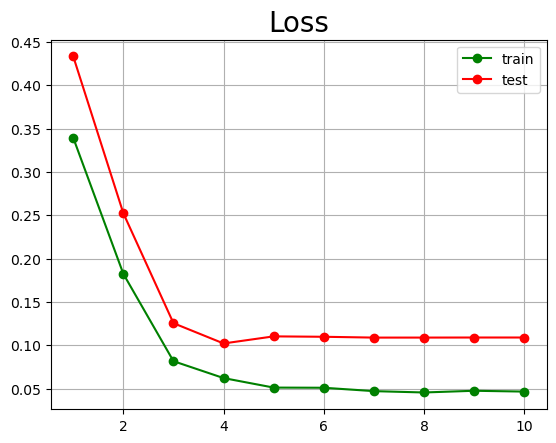

In [32]:
# plot loss
plt.plot(np.arange(1, args.epochs + 1), np.array(train_loss), 'go-')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_loss), 'ro-')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("Loss")
plt.grid(True)
plt.legend(["train", "test"], loc="upper right")
plt.savefig("../output/Loss.png", dpi=600)

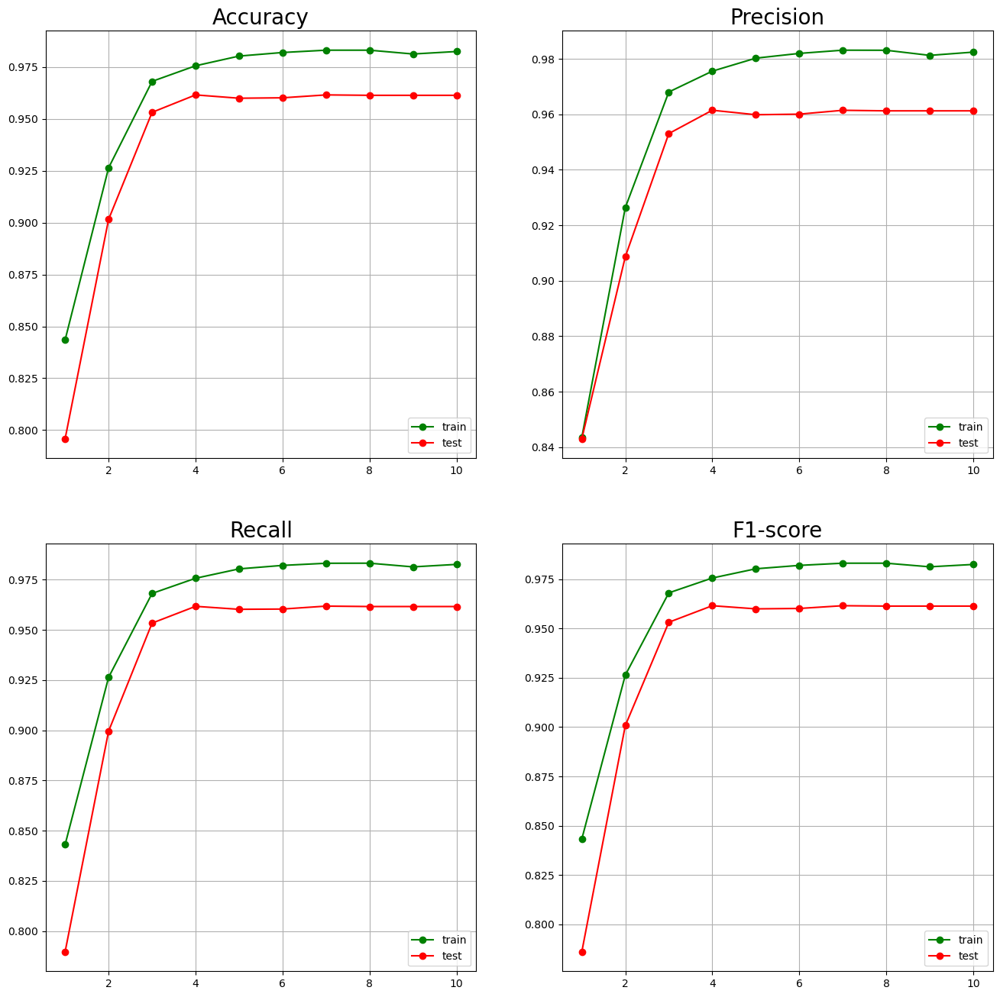

In [33]:
figure = plt.figure(figsize=(16,16))

# plot accuracy
figure.add_subplot(2, 2, 1)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_acc), 'go-')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_acc), 'ro-')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("Accuracy")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
plt.savefig("../output/Accuracy.png", dpi=600)

# plot precision
figure.add_subplot(2, 2, 2)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_precision), 'go-')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_precision), 'ro-')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("Precision")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
plt.savefig("../output/Precision.png", dpi=600)

# plot recall
figure.add_subplot(2, 2, 3)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_recall), 'go-')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_recall), 'ro-')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("Recall")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
plt.savefig("../output/Recall.png", dpi=600)

# plot F1-score
figure.add_subplot(2, 2, 4)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_f1), 'go-')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_f1), 'ro-')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("F1-score")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
plt.savefig("../output/F1-score.png", dpi=600)

## 5.3 Classification prediction

Visualize the prediction results of real and fake faces in the format of: "true label -> predicted label".

In [34]:
def showprediction(indices):
    figure = plt.figure(figsize=(16, 16))
    for i in range(16):
        index = indices[i]
        data, true_label = valid_dataset[index]
        true_label = idx_to_class[true_label]
        img = data.permute(1, 2, 0)
        data = data.unsqueeze(0).to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        pred_label = idx_to_class[pred.item()]
        figure.add_subplot(4, 4, i + 1)
        plt.title(true_label + " -> " + pred_label)
        plt.axis("off")
        plt.imshow(img)

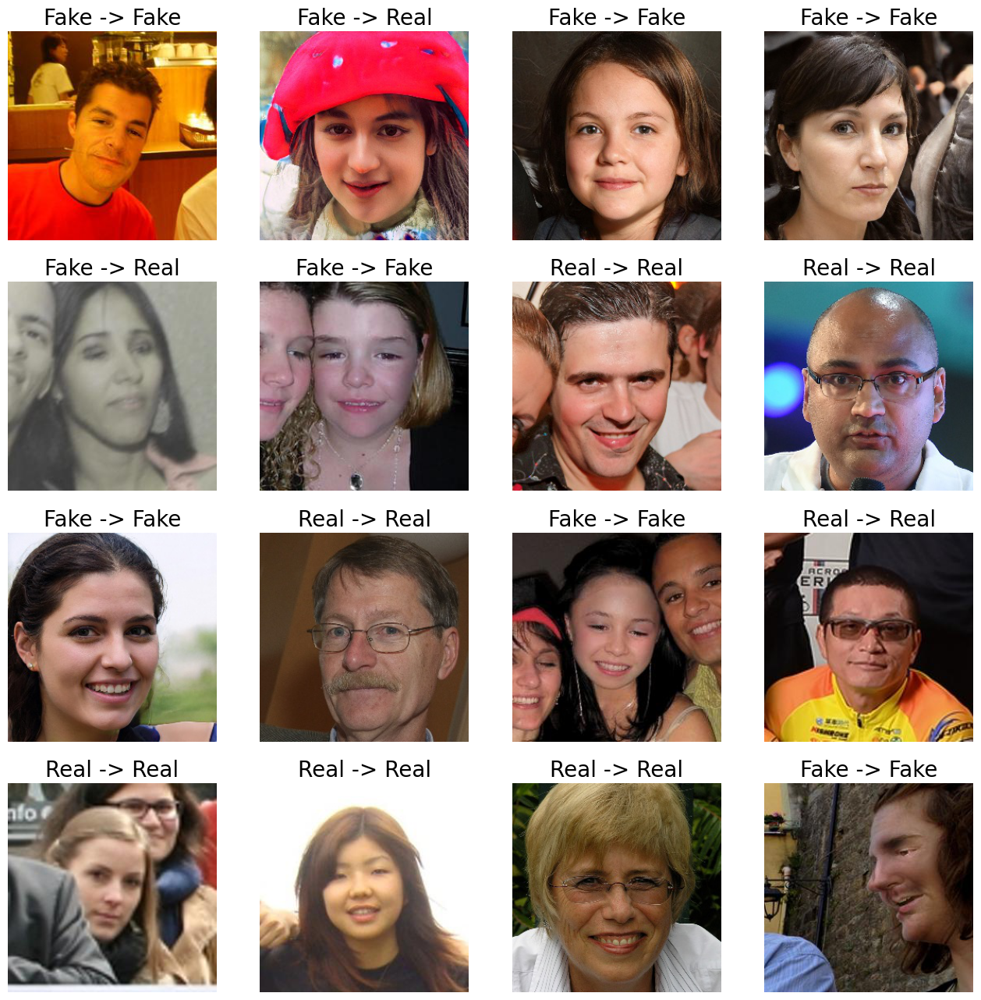

In [35]:
indices = [random.randint(0, len(valid_dataset)) for i in range(16)]
showprediction(indices)

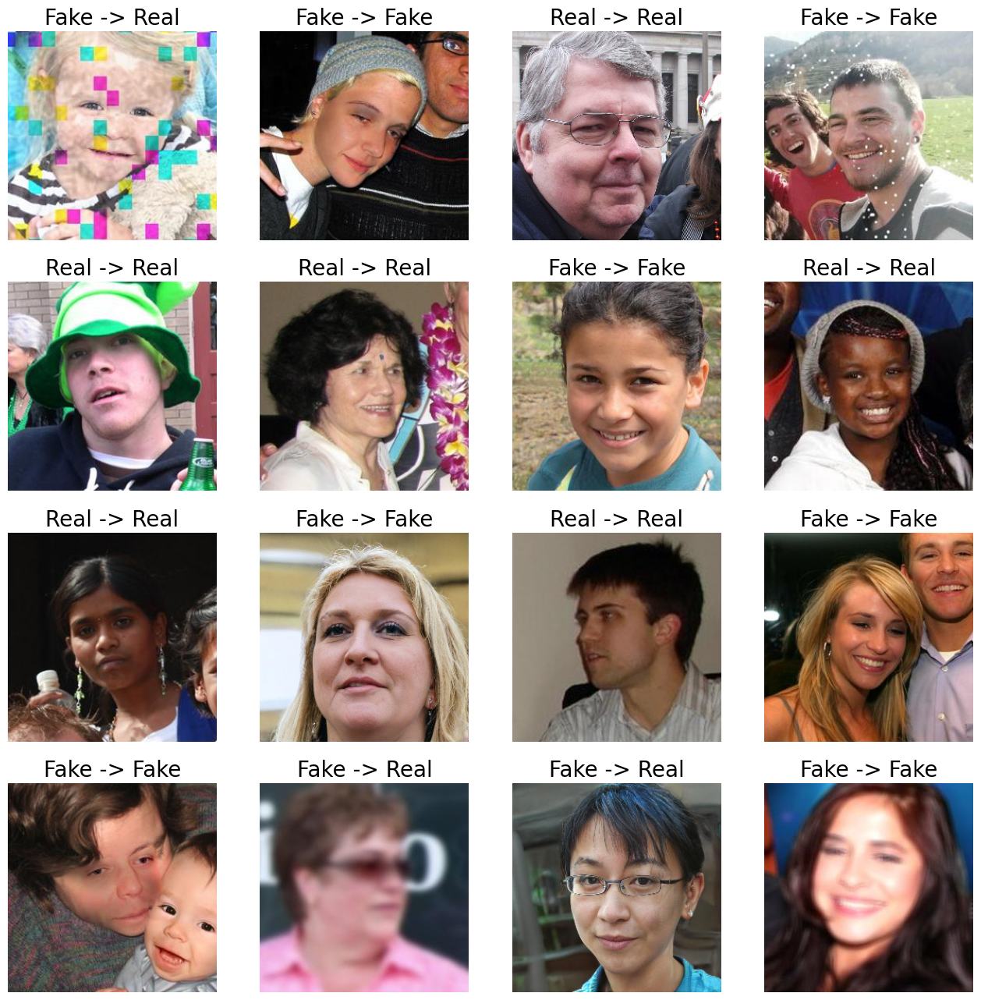

In [36]:
indices = [random.randint(0, len(valid_dataset)) for i in range(16)]
showprediction(indices)

## 5.4 Grad-CAM

Use pytorch-grad-cam to visualize cam. Observing areas that have a significant impact on prediction results.

In [37]:
target_layer = [model.norm]

In [38]:
index = 4
data, label = valid_dataset[index]
data = data.unsqueeze(0).to(device)
rgb_img = np.transpose(data.cpu().numpy().squeeze(0), (1,2,0))

In [39]:
def rt(tensor, height=8, width=8):
    result = tensor.reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)
    return result

In [40]:
cam = GradCAMPlusPlus(model=model, target_layers=target_layer, use_cuda=True, reshape_transform=rt)
grayscale_cam = cam(input_tensor=data, aug_smooth=True)[0]

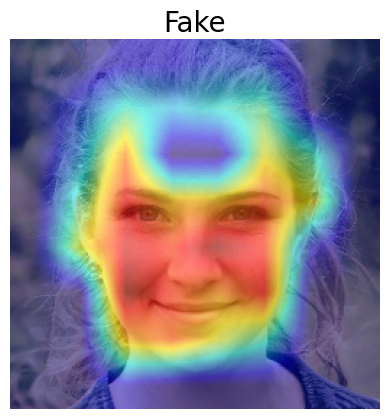

In [41]:
cam_img = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
plt.title(idx_to_class[label])
plt.axis("off")
plt.imshow(cam_img);

## 5.5 Captum

Use facebook captum to visualize feature map. It may help us to locate those pixels that affect the results.

In [42]:
model.zero_grad()
model.eval();

In [43]:
index = 5
data, label = valid_dataset[index]
data = data.unsqueeze(0).to(device)
data.requires_grad = True

### 5.5.1 Original Image

In [44]:
original_image = np.transpose(data.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

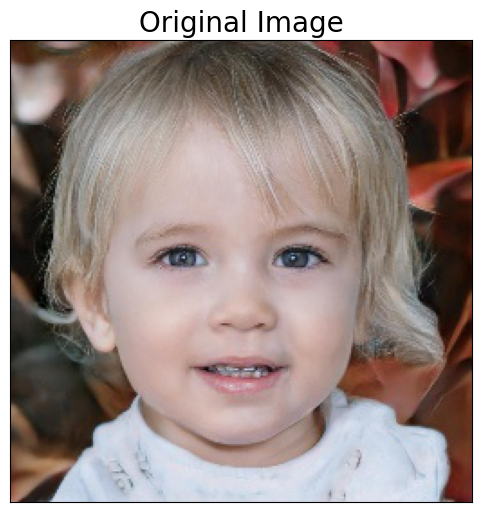

In [45]:
viz.visualize_image_attr(None, original_image, method="original_image", title="Original Image");

### 5.5.2 Overlayed Gradient Magnitudes

Make sure you have enough cuda memory to run the following commented code.

In [46]:
# saliency = Saliency(model)
# grads = saliency.attribute(data, target=label)
# grads = np.transpose(grads.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

In [47]:
# viz.visualize_image_attr(grads, original_image, method="blended_heat_map", sign="absolute_value",
#                          show_colorbar=True, title="Overlayed Gradient Magnitudes");

In [48]:
# del saliency, grads
# for i in range(10):
#     torch.cuda.empty_cache()

### 5.5.3 Overlayed Integrated Gradients

Make sure you have enough cuda memory to run the following commented code.

In [49]:
# ig = IntegratedGradients(model)
# attr_ig = ig.attribute(data, target=label, baselines=data * 0)
# attr_ig = np.transpose(attr_ig.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

In [50]:
# viz.visualize_image_attr(attr_ig, original_image, method="blended_heat_map", sign="all",
#                              show_colorbar=True, title="Overlayed Integrated Gradients");

In [51]:
# del ig, attr_ig
# for i in range(10):
#     torch.cuda.empty_cache()

### 5.5.4 Overlayed DeepLift

Make sure you have enough cuda memory to run the following commented code.

In [52]:
# dl = DeepLift(model)
# attr_dl = dl.attribute(data, target=label, baselines=data * 0)
# attr_dl = np.transpose(attr_dl.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

In [53]:
# viz.visualize_image_attr(attr_dl, original_image, method="blended_heat_map", sign="all",
#                          show_colorbar=True, title="Overlayed DeepLift");

In [54]:
# del dl, attr_dl
# for i in range(10):
#     torch.cuda.empty_cache()

### 5.5.5 Occlusion-based attribution

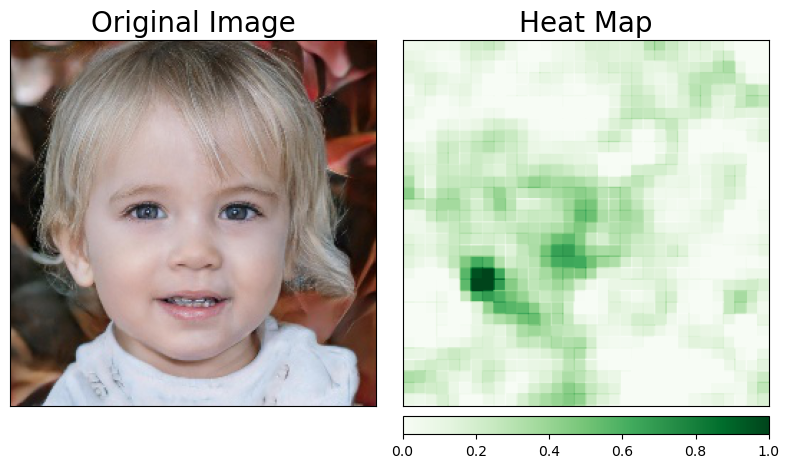

In [55]:
occlusion = Occlusion(model)
attributions_occ = occlusion.attribute(data, strides=(3,8,8), target=label, sliding_window_shapes=(3,15,15), baselines=0)
attributions_occ = np.transpose(attributions_occ.squeeze(0).cpu().detach().numpy(), (1, 2, 0))
viz.visualize_image_attr_multiple(attributions_occ, original_image, ["original_image", "heat_map"],
                                  ["all", "positive"], titles=["Original Image", "Heat Map"], 
                                  show_colorbar=True, outlier_perc=2);

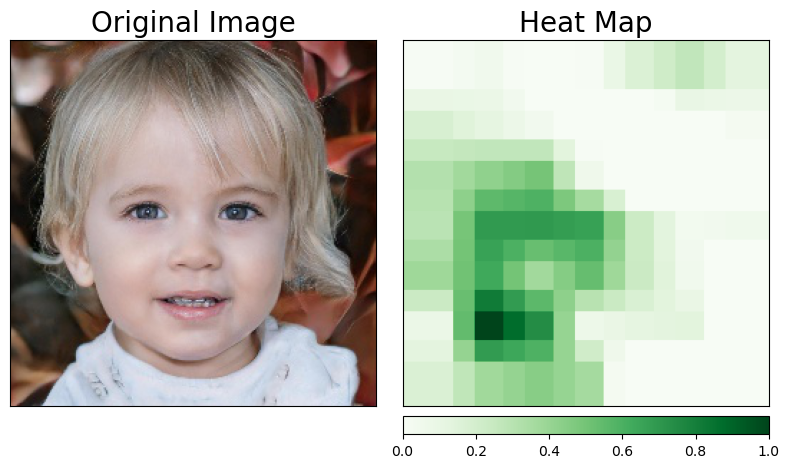

In [56]:
occlusion = Occlusion(model)
attributions_occ = occlusion.attribute(data, strides=(3,35,35), target=label, sliding_window_shapes=(3,50,50), baselines=0)
attributions_occ = np.transpose(attributions_occ.squeeze(0).cpu().detach().numpy(), (1, 2, 0))
viz.visualize_image_attr_multiple(attributions_occ, original_image, ["original_image", "heat_map"],
                                  ["all", "positive"], titles=["Original Image", "Heat Map"], 
                                  show_colorbar=True, outlier_perc=2);

In [57]:
del occlusion, attributions_occ
for i in range(10):
    torch.cuda.empty_cache()